In [1]:
pip install plotly


[notice] A new release of pip is available: 23.1.2 -> 24.0
[notice] To update, run: pip3.10 install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [35]:
pip install -U kaleido


[notice] A new release of pip is available: 23.1.2 -> 24.0
[notice] To update, run: pip3.10 install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [71]:
import pandas as pd
import numpy as np

def get_dataset(filepath):
    df = pd.read_csv(filepath)
    #print(df.head())
    human = ['no_sentence_human', 'num_words_human', 'character0_human', 'character1_human', 'character2_3_human', 'character4_human', 'character5_human', 'std_dev_human', 'sent_len_diff_human', 'count_short_sentences_in_paragraphs_human', 'count_long_sentences_in_paragraphs_human', 'check_word0_human', 'check_word1_human', 'check_word2_3_human', 'check_word3_human', 'check_word4_human', 'check_word5_human', 'check_num_human', 'check_capitals_human', 'check_et_human']
    machine = ['no_sentence_machine', 'num_words_machine', 'character0_machine', 'character1_machine', 'character2_3_machine', 'character4_machine', 'character5_machine', 'std_dev_machine', 'sent_len_diff_machine', 'count_short_sentences_in_paragraphs_machine', 'count_long_sentences_in_paragraphs_machine', 'check_word0_machine', 'check_word1_machine', 'check_word2_3_machine', 'check_word3_machine', 'check_word4_machine', 'check_word5_machine', 'check_num_machine', 'check_capitals_machine', 'check_et_machine']

    df_human = df.loc[:, human]
    df_human['class'] = 0
    df_machine = df.loc[:, machine]
    df_machine['class'] = 1

    human = {'no_sentence_human': 'no_sentence', 'num_words_human': 'num_words', 'character0_human': 'character0', 'character1_human': 'character1', 'character2_3_human': 'character2_3', 'character4_human': 'character4', 'character5_human': 'character5', 'std_dev_human': 'std_dev', 'sent_len_diff_human': 'sent_len_diff', 'count_short_sentences_in_paragraphs_human': 'count_short_sentences_in_paragraphs', 'count_long_sentences_in_paragraphs_human': 'count_long_sentences_in_paragraphs', 'check_word0_human': 'check_word0', 'check_word1_human': 'check_word1', 'check_word2_3_human': 'check_word2_3', 'check_word3_human': 'check_word3', 'check_word4_human': 'check_word4', 'check_word5_human': 'check_word5', 'check_num_human': 'check_num', 'check_capitals_human': 'check_capitals', 'check_et_human': 'check_et'}
    machine = {'no_sentence_machine': 'no_sentence', 'num_words_machine': 'num_words', 'character0_machine': 'character0', 'character1_machine': 'character1', 'character2_3_machine': 'character2_3', 'character4_machine': 'character4', 'character5_machine': 'character5', 'std_dev_machine': 'std_dev', 'sent_len_diff_machine': 'sent_len_diff', 'count_short_sentences_in_paragraphs_machine': 'count_short_sentences_in_paragraphs', 'count_long_sentences_in_paragraphs_machine': 'count_long_sentences_in_paragraphs', 'check_word0_machine': 'check_word0', 'check_word1_machine': 'check_word1', 'check_word2_3_machine': 'check_word2_3', 'check_word3_machine': 'check_word3', 'check_word4_machine': 'check_word4', 'check_word5_machine': 'check_word5', 'check_num_machine': 'check_num', 'check_capitals_machine': 'check_capitals', 'check_et_machine': 'check_et'}

    df_human = df_human.rename(columns=human)
    df_machine = df_machine.rename(columns=machine)

    full_df = pd.concat([df_human, df_machine], ignore_index=True)
    #print(full_df.head())

    X = full_df.iloc[:,:-1]
    y = full_df.iloc[:,-1]

    return X, full_df

In [15]:
pip install -U kaleido

'/Users/supriyaupadhyaya/ovgu/generative-text-detectors/colab'

In [82]:
import plotly.graph_objects as go
import pandas as pd
import os
import kaleido 
kaleido.__version__


filepath = ['../feature-extractor/features/m4/arxiv_bloomz_feature_counts.csv',
            '../feature-extractor/features/m4/arxiv_bloomz_paraphrased_feature_counts.csv',
            '../feature-extractor/features/m4/arxiv_chatGPT_feature_counts.csv',
            '../feature-extractor/features/m4/arxiv_chatGPT_paraphrased_feature_counts.csv',
            '../feature-extractor/features/m4/arxiv_cohere_feature_counts.csv',
            '../feature-extractor/features/m4/arxiv_davinci_feature_counts.csv',
            '../feature-extractor/features/m4/arxiv_flant5_feature_counts.csv'
    
]

for model in filepath:
    df_X, df_y = get_dataset(model)
    index_vals = df_y["class"].astype("category").cat.codes

    dims = []
    for col in df_X.columns.tolist():
        dims.append(dict(label=col, values=df_X[col]))

    fig = go.Figure(
        data=go.Splom(
            dimensions=dims,
            showupperhalf=False,
            text=df_y["class"],
            marker=dict(
                color=index_vals,
                showscale=False,
                line_color="white",
                line_width=0.5,
            ),
        )
    )

    title = "Scatter plot - 20 style features of " + model.split('/')[4].split('.')[0]
    fig.update_layout(
        title=title,
        hoversubplots="axis",
        width=3000,
        height=3000,
        hovermode="x",
        showlegend=True
    )

    name = "..\plots\scatterplot_" + model.split('/')[4].split('.')[0] + ".png"
    fig.show()

#yellow - 1
#purple - 0

/var/folders/n2/wvbyn25n1xgcbwfkrnb9r7tm0000gn/T/ipykernel_22796/4274845987.py:20: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



../feature-extractor/features/m4/arxiv_bloomz_feature_counts.csv


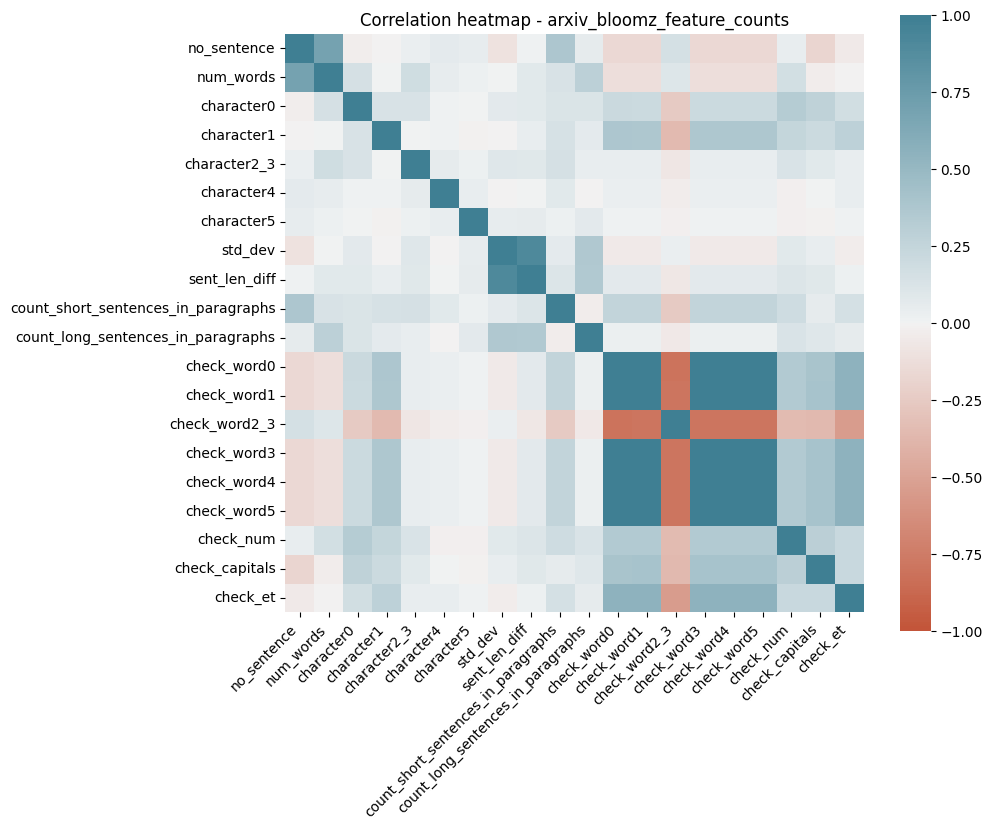

/var/folders/n2/wvbyn25n1xgcbwfkrnb9r7tm0000gn/T/ipykernel_22796/4274845987.py:20: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



../feature-extractor/features/m4/arxiv_bloomz_paraphrased_feature_counts.csv


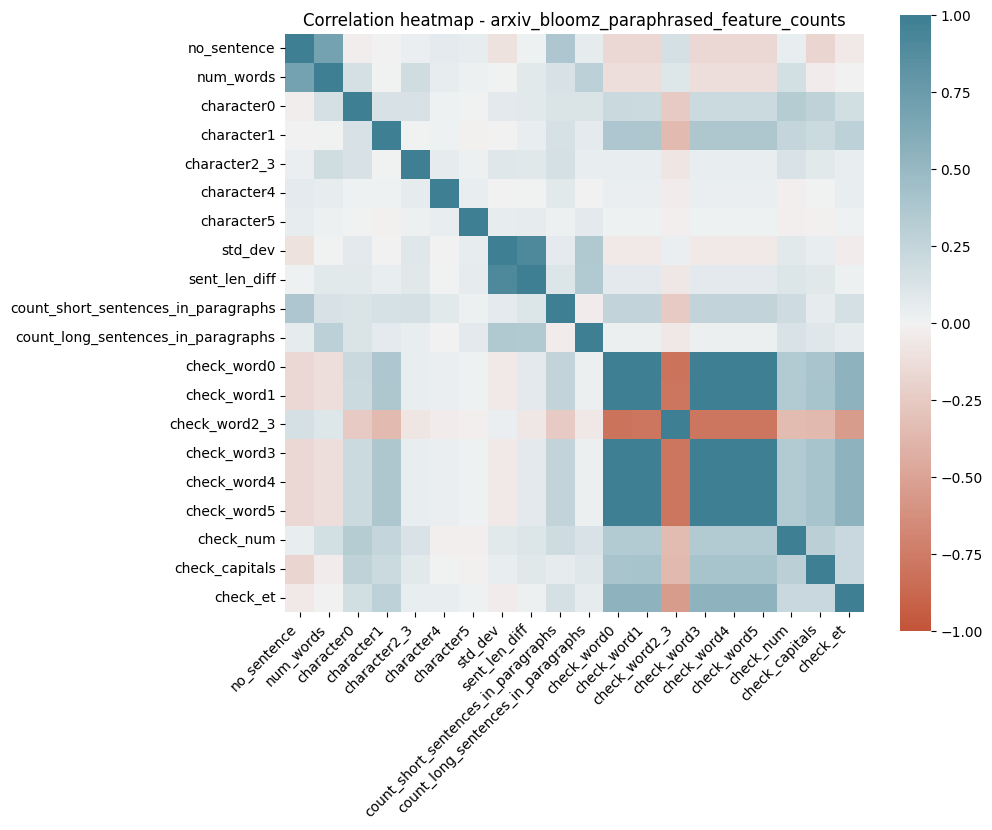

/var/folders/n2/wvbyn25n1xgcbwfkrnb9r7tm0000gn/T/ipykernel_22796/4274845987.py:20: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



../feature-extractor/features/m4/arxiv_chatGPT_feature_counts.csv


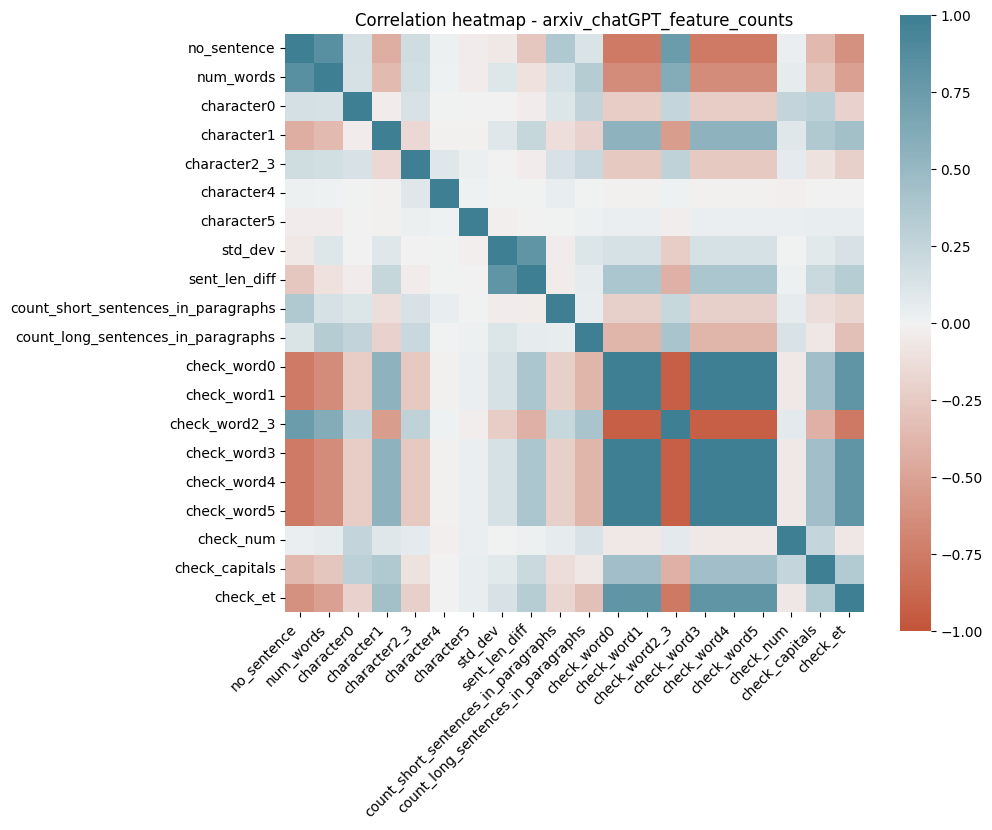

/var/folders/n2/wvbyn25n1xgcbwfkrnb9r7tm0000gn/T/ipykernel_22796/4274845987.py:20: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



../feature-extractor/features/m4/arxiv_chatGPT_paraphrased_feature_counts.csv


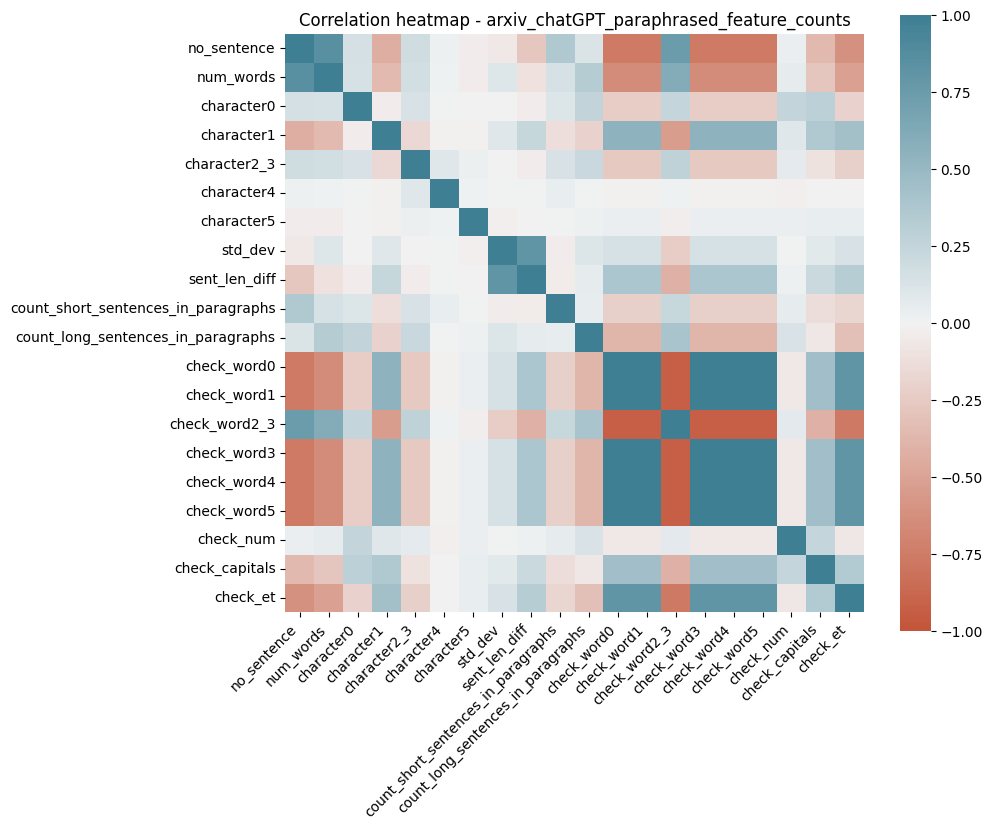

/var/folders/n2/wvbyn25n1xgcbwfkrnb9r7tm0000gn/T/ipykernel_22796/4274845987.py:20: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



../feature-extractor/features/m4/arxiv_cohere_feature_counts.csv


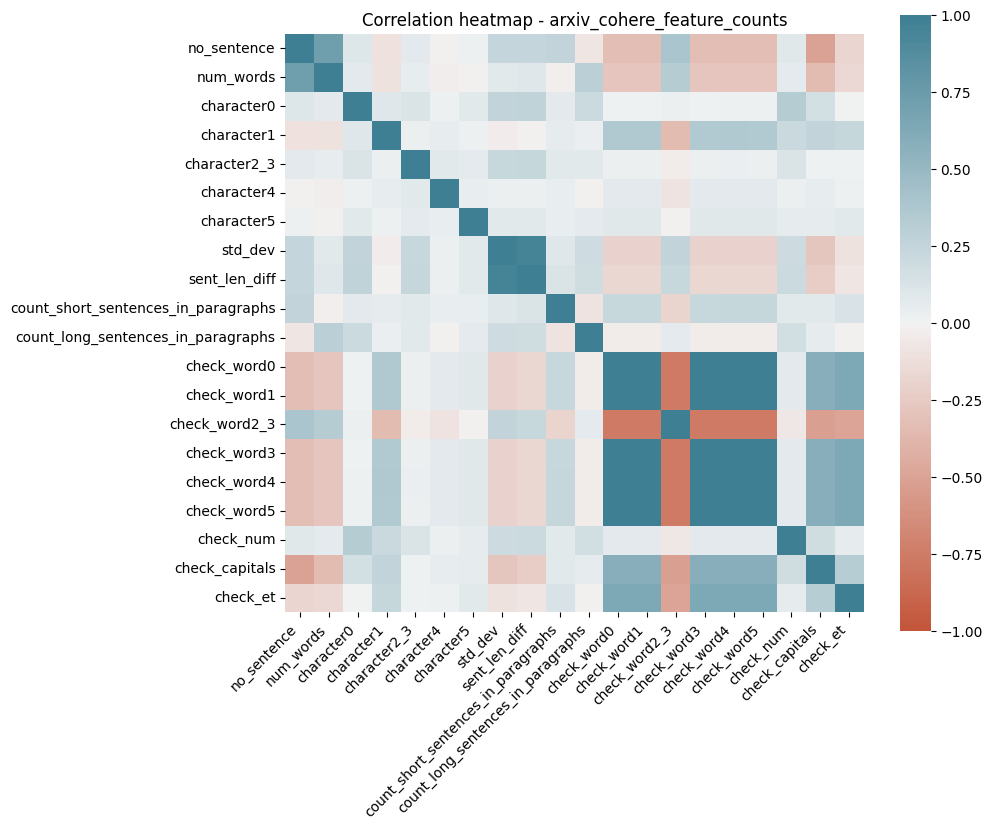

/var/folders/n2/wvbyn25n1xgcbwfkrnb9r7tm0000gn/T/ipykernel_22796/4274845987.py:20: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



../feature-extractor/features/m4/arxiv_davinci_feature_counts.csv


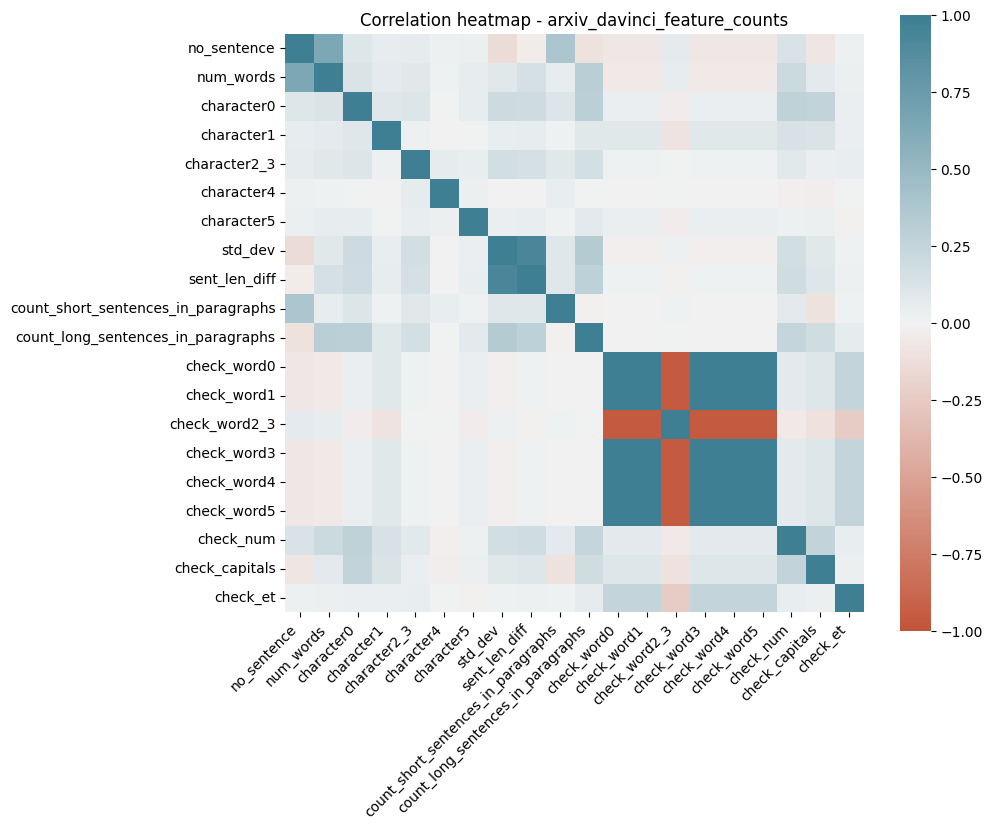

/var/folders/n2/wvbyn25n1xgcbwfkrnb9r7tm0000gn/T/ipykernel_22796/4274845987.py:20: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



../feature-extractor/features/m4/arxiv_flant5_feature_counts.csv


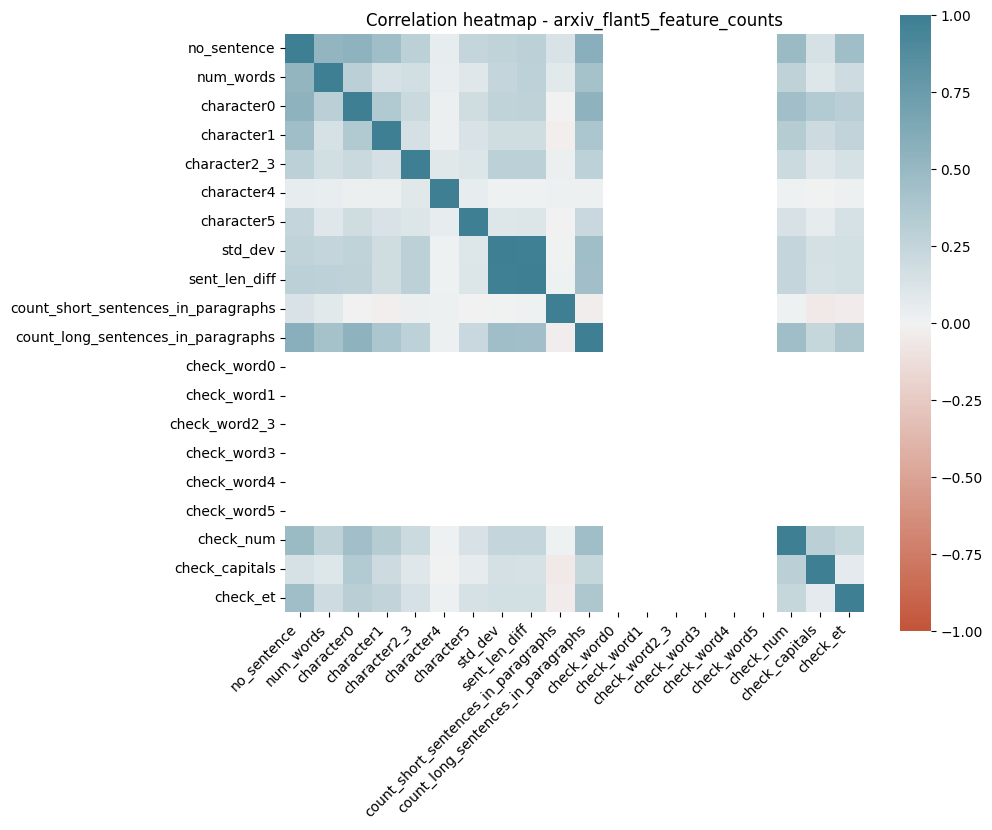

In [84]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of file paths
filepath = ['../feature-extractor/features/m4/arxiv_bloomz_feature_counts.csv',
            '../feature-extractor/features/m4/arxiv_bloomz_paraphrased_feature_counts.csv',
            '../feature-extractor/features/m4/arxiv_chatGPT_feature_counts.csv',
            '../feature-extractor/features/m4/arxiv_chatGPT_paraphrased_feature_counts.csv',
            '../feature-extractor/features/m4/arxiv_cohere_feature_counts.csv',
            '../feature-extractor/features/m4/arxiv_davinci_feature_counts.csv',
            '../feature-extractor/features/m4/arxiv_flant5_feature_counts.csv'
            ]

def heatmap(model):
    # Set up the figure and axes with desired size
    fig, ax = plt.subplots(figsize=(10, 8))  # Adjust the figsize as needed

    # Setup a 1x15 grid
    plot_grid = plt.GridSpec(1, 15, hspace=0.2, wspace=0.1)
    ax = plt.subplot(plot_grid[:, :-1])  # Use the leftmost 14 columns of the grid for the main plot
    df_X, df_y = get_dataset(model)
    print(model)
    corr = df_X.corr()
    sns.heatmap(
        corr,
        vmin=-1, vmax=1, center=0,
        cmap=sns.diverging_palette(20, 220, n=3000),
        square=True,
        ax=ax  # Specify the axes to plot the heatmap
    )

    ax.set_xticklabels(
        ax.get_xticklabels(),
        rotation=45,
        horizontalalignment='right'
    )
    name = "Correlation heatmap - " + model.split('/')[4].split('.')[0]
    plt.title(name)
    plt.show()

for model in filepath:
    heatmap(model)
    
